In [1]:
import numpy as np
import astropy.units as u
from astropy.wcs import WCS
from reproject import reproject_interp
from astropy.coordinates import SkyCoord
from astropy.io import fits
import matplotlib as mpl
import matplotlib.pyplot as plt
import h5py
import pandas as pd

from deproject import deproject, get_galaxy_specs

Set OBSGEO-B to   -37.752345 from OBSGEO-[XYZ].
Set OBSGEO-H to 1738852822.655 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to   -37.752345 from OBSGEO-[XYZ].
Set OBSGEO-H to 1738852822.655 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


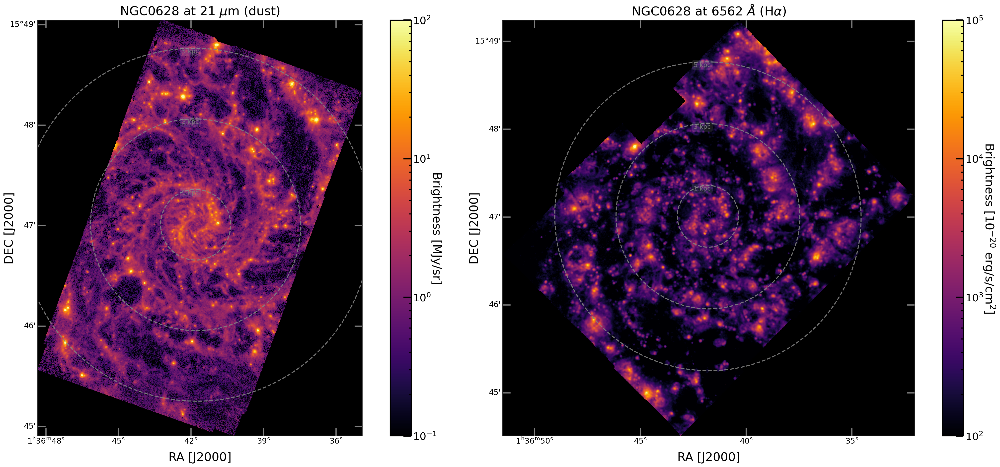

In [31]:
from skimage import measure

f = plt.figure(figsize=(30, 12))

f.set_dpi(150)
f.set_facecolor('white')

dust_hdu_galx = fits.open('ISM/JWST-MIRI-21micron-dust/ngc0628_miri_f2100w_anchored.fits')[-1]
wcs_im = WCS(dust_hdu_galx.header)
ax0 = f.add_subplot(121, projection=wcs_im)


cm = plt.cm.get_cmap('inferno')
plt.set_cmap(cm)


# dust
im = ax0.imshow(dust_hdu_galx.data, origin='lower', norm=mpl.colors.LogNorm(vmin=1e-1, vmax=1e2), aspect='equal')
mask = np.isnan(dust_hdu_galx.data) | np.isinf(dust_hdu_galx.data) | np.equal(dust_hdu_galx.data, 0) | (dust_hdu_galx.data<0)
xvals = np.where(~(mask).all(axis=0))
yvals = np.where(~(mask).all(axis=1))
ax0.set_xlim(min(xvals[0]), max(xvals[0]))
ax0.set_ylim(min(yvals[0]), max(yvals[0]))

RA, DEC, POSANG, INCL, DIST = get_galaxy_specs('NGC0628') # DIST [Mpc]
coords = SkyCoord.from_name('NGC0628')
deproj_img = deproject(center_coord=(RA*u.deg, DEC*u.deg), incl=INCL*u.deg, pa=POSANG*u.deg,
                       header=dust_hdu_galx.header, wcs=None, naxis=None, ra=None, dec=None,
                       return_offset=False)
r_deg = deproj_img[0]
r_pc = r_deg * (np.pi / 180) * (DIST * 1e6) # in pc
data = dust_hdu_galx.data.flatten()
radii = r_pc.flatten()
#         data = hdu_galx.data
r_center_mask = (r_pc>0.1*1e3) | np.isnan(dust_hdu_galx.data) | np.isinf(dust_hdu_galx.data) | np.equal(dust_hdu_galx.data, 0) | (dust_hdu_galx.data<0)
r_center_xvals = np.where(~(r_center_mask).all(axis=0))
for R_cuts in np.array([1, 3, 5, 10, 15, 20])*1e3: # 1, 2, 5, ... kpc
    contours = measure.find_contours(r_pc, R_cuts)
    for contour in contours:
        ax0.plot(contour[:, 1], contour[:, 0], color='grey', linewidth=2, ls='--', alpha=0.9) 

    r_mask = (r_pc>R_cuts) | np.isnan(dust_hdu_galx.data) | np.isinf(dust_hdu_galx.data) | np.equal(dust_hdu_galx.data, 0) | (dust_hdu_galx.data<0)
    r_xvals = np.where(~(r_mask).all(axis=0))
    r_yvals = np.where(~(r_mask).all(axis=1))
    props = dict(boxstyle='round', facecolor='white', edgecolor='none', alpha=0.1)
    if abs(min(r_center_xvals[0])-min(xvals[0]))<10 or abs(min(r_center_xvals[0])-max(xvals[0]))<10 or abs(max(r_yvals[0])-min(yvals[0]))<10 or abs(max(r_yvals[0])-max(yvals[0]))<10 :
        pass
    else:
        ax0.text(max(r_center_xvals[0]), max(r_yvals[0]), str(int(R_cuts/1e3))+' kpc', fontsize=12,
                 color='grey', verticalalignment='top', horizontalalignment='right', bbox=props, alpha=0.9)
cbar = f.colorbar(im, ax=ax0)
cbar.set_label('Brightness [MJy/sr]', rotation=270, fontsize=23, labelpad=10)
cbar.ax.tick_params(direction='in', which='both', labelsize=20)
cbar.ax.tick_params(which='major', length=15, width=3)
cbar.ax.tick_params(which='minor', length=5, width=2)
plt.setp(cbar.ax.spines.values(), linewidth=2)
plt.setp(ax0.spines.values(), linewidth=3)
ax0.set_title('NGC0628 at 21 $\mu$m (dust)', fontsize=24, pad=10)


# Ha
Ha_hdu_galx = Ha_hdu_galx = fits.open('ISM/VLT-MUSE-Halpha/NGC0628-0.92asec_MAPS.fits')['HA6562_FLUX']
wcs_im = WCS(Ha_hdu_galx.header)
ax1 = f.add_subplot(122, projection=wcs_im)

im = ax1.imshow(Ha_hdu_galx.data, origin='lower', norm=mpl.colors.LogNorm(vmin=1e2, vmax=1e5), aspect='equal')
mask = np.isnan(Ha_hdu_galx.data) | np.isinf(Ha_hdu_galx.data) | np.equal(Ha_hdu_galx.data, 0) | (Ha_hdu_galx.data<0)
xvals = np.where(~(mask).all(axis=0))
yvals = np.where(~(mask).all(axis=1))
ax1.set_xlim(min(xvals[0]), max(xvals[0]))
ax1.set_ylim(min(yvals[0]), max(yvals[0]))

RA, DEC, POSANG, INCL, DIST = get_galaxy_specs('NGC0628') # DIST [Mpc]
coords = SkyCoord.from_name('NGC0628')
deproj_img = deproject(center_coord=(RA*u.deg, DEC*u.deg), incl=INCL*u.deg, pa=POSANG*u.deg,
                       header=Ha_hdu_galx.header, wcs=None, naxis=None, ra=None, dec=None,
                       return_offset=False)
r_deg = deproj_img[0]
r_pc = r_deg * (np.pi / 180) * (DIST * 1e6) # in pc
data = Ha_hdu_galx.data.flatten()
radii = r_pc.flatten()
#         data = hdu_galx.data
r_center_mask = (r_pc>0.1*1e3) | np.isnan(Ha_hdu_galx.data) | np.isinf(Ha_hdu_galx.data) | np.equal(Ha_hdu_galx.data, 0) | (Ha_hdu_galx.data<0)
r_center_xvals = np.where(~(r_center_mask).all(axis=0))
for R_cuts in np.array([1, 3, 5, 10, 15, 20])*1e3: # 1, 2, 5, ... kpc
    contours = measure.find_contours(r_pc, R_cuts)
    for contour in contours:
        ax1.plot(contour[:, 1], contour[:, 0], color='grey', linewidth=2, ls='--', alpha=0.9) 

    r_mask = (r_pc>R_cuts) | np.isnan(Ha_hdu_galx.data) | np.isinf(Ha_hdu_galx.data) | np.equal(Ha_hdu_galx.data, 0) | (Ha_hdu_galx.data<0)
    r_xvals = np.where(~(r_mask).all(axis=0))
    r_yvals = np.where(~(r_mask).all(axis=1))
    props = dict(boxstyle='round', facecolor='white', edgecolor='none', alpha=0.1)
    if abs(min(r_center_xvals[0])-min(xvals[0]))<10 or abs(min(r_center_xvals[0])-max(xvals[0]))<10 or abs(max(r_yvals[0])-min(yvals[0]))<10 or abs(max(r_yvals[0])-max(yvals[0]))<10 :
        pass
    else:
        ax1.text(max(r_center_xvals[0]), max(r_yvals[0]), str(int(R_cuts/1e3))+' kpc', fontsize=12,
                 color='grey', verticalalignment='top', horizontalalignment='right', bbox=props, alpha=0.9)
cbar = f.colorbar(im, ax=ax1)
cbar.set_label('Brightness [$10^{-20}$ erg/s/cm$^2$]', rotation=270, fontsize=23, labelpad=25)
cbar.ax.tick_params(direction='in', which='both', labelsize=20)
cbar.ax.tick_params(which='major', length=15, width=3)
cbar.ax.tick_params(which='minor', length=5, width=2)
plt.setp(cbar.ax.spines.values(), linewidth=2)
plt.setp(ax1.spines.values(), linewidth=3)
ax1.set_title('NGC0628 at 6562 $\AA$ (H$\\alpha$)', fontsize=24, pad=10)

for ax in [ax0, ax1]:
    ax.set_facecolor("black")
    ax.tick_params(which='major', direction='in', color='grey', length=15, width=2, labelsize=15)
    ax.set_xlabel('RA [J2000]', fontsize=23)
    ax.set_ylabel('DEC [J2000]', fontsize=23, labelpad=0.02)
    
f.tight_layout()


Set OBSGEO-B to   -38.353367 from OBSGEO-[XYZ].
Set OBSGEO-H to 1740828096.544 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.353367 from OBSGEO-[XYZ].
Set OBSGEO-H to 1740828096.544 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


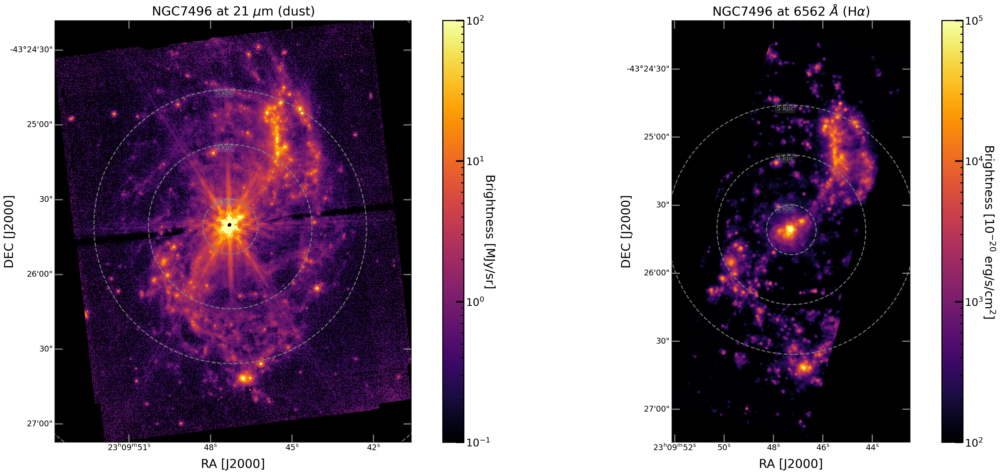

In [2]:
from skimage import measure

f = plt.figure(figsize=(30, 12))

f.set_dpi(150)
f.set_facecolor('white')

dust_hdu_galx = fits.open('ISM/JWST-MIRI-21micron-dust/ngc7496_miri_f2100w_anchored.fits')[-1]
wcs_im = WCS(dust_hdu_galx.header)
ax0 = f.add_subplot(121, projection=wcs_im)


cm = plt.cm.get_cmap('inferno')
plt.set_cmap(cm)


# dust
im = ax0.imshow(dust_hdu_galx.data, origin='lower', norm=mpl.colors.LogNorm(vmin=1e-1, vmax=1e2), aspect='equal')
mask = np.isnan(dust_hdu_galx.data) | np.isinf(dust_hdu_galx.data) | np.equal(dust_hdu_galx.data, 0) | (dust_hdu_galx.data<0)
xvals = np.where(~(mask).all(axis=0))
yvals = np.where(~(mask).all(axis=1))
ax0.set_xlim(min(xvals[0]), max(xvals[0]))
ax0.set_ylim(min(yvals[0]), max(yvals[0]))

RA, DEC, POSANG, INCL, DIST = get_galaxy_specs('NGC7496') # DIST [Mpc]
coords = SkyCoord.from_name('NGC7496')
deproj_img = deproject(center_coord=(RA*u.deg, DEC*u.deg), incl=INCL*u.deg, pa=POSANG*u.deg,
                       header=dust_hdu_galx.header, wcs=None, naxis=None, ra=None, dec=None,
                       return_offset=False)
r_deg = deproj_img[0]
r_pc = r_deg * (np.pi / 180) * (DIST * 1e6) # in pc
data = dust_hdu_galx.data.flatten()
radii = r_pc.flatten()
#         data = hdu_galx.data
r_center_mask = (r_pc>0.1*1e3) | np.isnan(dust_hdu_galx.data) | np.isinf(dust_hdu_galx.data) | np.equal(dust_hdu_galx.data, 0) | (dust_hdu_galx.data<0)
r_center_xvals = np.where(~(r_center_mask).all(axis=0))
for R_cuts in np.array([1, 3, 5, 10, 15, 20])*1e3: # 1, 2, 5, ... kpc
    contours = measure.find_contours(r_pc, R_cuts)
    for contour in contours:
        ax0.plot(contour[:, 1], contour[:, 0], color='grey', linewidth=2, ls='--', alpha=0.9) 

    r_mask = (r_pc>R_cuts) | np.isnan(dust_hdu_galx.data) | np.isinf(dust_hdu_galx.data) | np.equal(dust_hdu_galx.data, 0) | (dust_hdu_galx.data<0)
    r_xvals = np.where(~(r_mask).all(axis=0))
    r_yvals = np.where(~(r_mask).all(axis=1))
    props = dict(boxstyle='round', facecolor='white', edgecolor='none', alpha=0.1)
    if abs(min(r_center_xvals[0])-min(xvals[0]))<10 or abs(min(r_center_xvals[0])-max(xvals[0]))<10 or abs(max(r_yvals[0])-min(yvals[0]))<10 or abs(max(r_yvals[0])-max(yvals[0]))<10 :
        pass
    else:
        ax0.text(max(r_center_xvals[0]), max(r_yvals[0]), str(int(R_cuts/1e3))+' kpc', fontsize=12,
                 color='grey', verticalalignment='top', horizontalalignment='right', bbox=props, alpha=0.9)
cbar = f.colorbar(im, ax=ax0)
cbar.set_label('Brightness [MJy/sr]', rotation=270, fontsize=23, labelpad=10)
cbar.ax.tick_params(direction='in', which='both', labelsize=20)
cbar.ax.tick_params(which='major', length=15, width=3)
cbar.ax.tick_params(which='minor', length=5, width=2)
plt.setp(cbar.ax.spines.values(), linewidth=2)
plt.setp(ax0.spines.values(), linewidth=3)
ax0.set_title('NGC7496 at 21 $\mu$m (dust)', fontsize=24, pad=10)


# Ha
Ha_hdu_galx = Ha_hdu_galx = fits.open('ISM/VLT-MUSE-Halpha/NGC7496-0.89asec_MAPS.fits')['HA6562_FLUX']
wcs_im = WCS(Ha_hdu_galx.header)
ax1 = f.add_subplot(122, projection=wcs_im)

im = ax1.imshow(Ha_hdu_galx.data, origin='lower', norm=mpl.colors.LogNorm(vmin=1e2, vmax=1e5), aspect='equal')
mask = np.isnan(Ha_hdu_galx.data) | np.isinf(Ha_hdu_galx.data) | np.equal(Ha_hdu_galx.data, 0) | (Ha_hdu_galx.data<0)
xvals = np.where(~(mask).all(axis=0))
yvals = np.where(~(mask).all(axis=1))
ax1.set_xlim(min(xvals[0]), max(xvals[0]))
ax1.set_ylim(min(yvals[0]), max(yvals[0]))

RA, DEC, POSANG, INCL, DIST = get_galaxy_specs('NGC7496') # DIST [Mpc]
coords = SkyCoord.from_name('NGC7496')
deproj_img = deproject(center_coord=(RA*u.deg, DEC*u.deg), incl=INCL*u.deg, pa=POSANG*u.deg,
                       header=Ha_hdu_galx.header, wcs=None, naxis=None, ra=None, dec=None,
                       return_offset=False)
r_deg = deproj_img[0]
r_pc = r_deg * (np.pi / 180) * (DIST * 1e6) # in pc
data = Ha_hdu_galx.data.flatten()
radii = r_pc.flatten()
#         data = hdu_galx.data
r_center_mask = (r_pc>0.1*1e3) | np.isnan(Ha_hdu_galx.data) | np.isinf(Ha_hdu_galx.data) | np.equal(Ha_hdu_galx.data, 0) | (Ha_hdu_galx.data<0)
r_center_xvals = np.where(~(r_center_mask).all(axis=0))
for R_cuts in np.array([1, 3, 5, 10, 15, 20])*1e3: # 1, 2, 5, ... kpc
    contours = measure.find_contours(r_pc, R_cuts)
    for contour in contours:
        ax1.plot(contour[:, 1], contour[:, 0], color='grey', linewidth=2, ls='--', alpha=0.9) 

    r_mask = (r_pc>R_cuts) | np.isnan(Ha_hdu_galx.data) | np.isinf(Ha_hdu_galx.data) | np.equal(Ha_hdu_galx.data, 0) | (Ha_hdu_galx.data<0)
    r_xvals = np.where(~(r_mask).all(axis=0))
    r_yvals = np.where(~(r_mask).all(axis=1))
    props = dict(boxstyle='round', facecolor='white', edgecolor='none', alpha=0.1)
    if abs(min(r_center_xvals[0])-min(xvals[0]))<10 or abs(min(r_center_xvals[0])-max(xvals[0]))<10 or abs(max(r_yvals[0])-min(yvals[0]))<10 or abs(max(r_yvals[0])-max(yvals[0]))<10 :
        pass
    else:
        ax1.text(max(r_center_xvals[0]), max(r_yvals[0]), str(int(R_cuts/1e3))+' kpc', fontsize=12,
                 color='grey', verticalalignment='top', horizontalalignment='right', bbox=props, alpha=0.9)
cbar = f.colorbar(im, ax=ax1)
cbar.set_label('Brightness [$10^{-20}$ erg/s/cm$^2$]', rotation=270, fontsize=23, labelpad=25)
cbar.ax.tick_params(direction='in', which='both', labelsize=20)
cbar.ax.tick_params(which='major', length=15, width=3)
cbar.ax.tick_params(which='minor', length=5, width=2)
plt.setp(cbar.ax.spines.values(), linewidth=2)
plt.setp(ax1.spines.values(), linewidth=3)
ax1.set_title('NGC7496 at 6562 $\AA$ (H$\\alpha$)', fontsize=24, pad=10)

for ax in [ax0, ax1]:
    ax.set_facecolor("black")
    ax.tick_params(which='major', direction='in', color='grey', length=15, width=2, labelsize=15)
    ax.set_xlabel('RA [J2000]', fontsize=23)
    ax.set_ylabel('DEC [J2000]', fontsize=23, labelpad=0.02)
    
f.tight_layout()


In [ ]:
# overlay